# PART I<br>DATA WRANGLING & EXPLANATORY ANALYSIS

# 1 Demographic Variables of Census Tracts

## 1.1 Data Collection Through API

In [1]:
from census_area import Census

In [2]:
# Initialize API key
api_key = "56ee867dc43e9c68de842ea51d8b52130c9ea382"
c = Census(key=api_key)

In [3]:
# Set FIPS codes of PA and Philly
PA_code = 42
Philly_code = 60000

In [8]:
# Codes for demographics of interest 
codes = ['NAME','B01001_002E', 'B01001_026E','B02001_002E', 'B01002_001E', 'B06001_002E', 'B19001_001E', 'B06009_005E']
# Request ACS data
tracts = c.acs5.state_place_tract(codes, PA_code, Philly_code,
                                  return_geometry=True)

## 1.2 Data Wrangling

### Convert ot GeoDataFrame

In [10]:
import geopandas as gpd
import pandas as pd

In [13]:
# Initialize geographical reference system as WGS 1984 
crs = {'init': 'epsg:4269'}
tracts_gdf = gpd.GeoDataFrame.from_features(tracts, crs = crs)

### Rename

In [14]:
# Rename columns of demographic variables based on correspondingly
tracts_gdf.rename(columns={'B01001_002E': 'male', 'B01001_026E': 'female',
                           'B02001_002E': 'white', 'B01002_001E': 'median_age',
                           'B06001_002E': 'under_5_years', 'B19001_001E': 'median_household_income',
                           'B06009_005E': 'bachelor'},
                  inplace=True)

### Select Needed Columns

In [15]:
tracts_gdf.columns

Index(['AREALAND', 'AREAWATER', 'male', 'female', 'median_age', 'white',
       'under_5_years', 'bachelor', 'median_household_income', 'BASENAME',
       'CENTLAT', 'CENTLON', 'COUNTY', 'FUNCSTAT', 'GEOID', 'INTPTLAT',
       'INTPTLON', 'LSADC', 'MTFCC', 'NAME', 'OBJECTID', 'OID', 'STATE',
       'STGEOMETRY.AREA', 'STGEOMETRY.LEN', 'TRACT', 'county', 'geometry',
       'state', 'tract', 'population', 'pct_male', 'pct_white',
       'pct_under_5_years', 'pct_bachelor', 'income_level'],
      dtype='object')

In [16]:
selection = ['median_age', 'median_household_income', 'population', 'pct_male', 'pct_white', 'pct_under_5_years', 'pct_bachelor', 'income_level',
            'NAME', 'GEOID', 'geometry']
tracts_gdf_selected = tracts_gdf[selection]
tracts_gdf_selected.head()

,median_age,median_household_income,population,pct_male,pct_white,pct_under_5_years,pct_bachelor,income_level,NAME,GEOID,geometry
0,40.6,1107.0,2491.0,54.315536,88.719390,3.853874,7.105580,low,"Census Tract 1001.03, Bucks County, Pennsylvania",42017100103,"POLYGON ((-74.984893 40.057287, -74.9848049999..."
1,30.9,2367.0,4155.0,48.712395,71.961492,2.382671,40.722022,high,"Census Tract 1, Philadelphia County, Pennsylvania",42101000100,"POLYGON ((-75.15221200000001 39.949968, -75.15..."
2,33.3,1010.0,2683.0,55.721208,26.015654,1.789042,19.567648,low,"Census Tract 2, Philadelphia County, Pennsylvania",42101000200,"POLYGON ((-75.162886 39.955329, -75.162688 39...."
3,32.6,1805.0,3534.0,44.397284,73.655914,2.631579,28.975665,median,"Census Tract 3, Philadelphia County, Pennsylvania",42101000300,"POLYGON ((-75.179937 39.960028, -75.1794150000..."
4,31.5,933.0,2514.0,56.722355,43.595863,1.392204,14.558473,low,"Census Tract 5, Philadelphia County, Pennsylvania",42101000500,"POLYGON ((-75.165299 39.952284, -75.165226 39...."


### Calculate the Percentages
Since census tracts have totally different areas and population, we need to convert these extensive values (in terms of actual data totals) into intensive values (in terms of densities) by calculating each percentage.

In [17]:
# Convert population-measured variables to the form of percentage
tracts_gdf['population'] = tracts_gdf['male'] + tracts_gdf['female'] 
tracts_gdf['pct_male'] = tracts_gdf['male'] / tracts_gdf['population'] * 100
tracts_gdf['pct_white'] = tracts_gdf['white'] / tracts_gdf['population'] * 100
tracts_gdf['pct_under_5_years'] = tracts_gdf['under_5_years'] / tracts_gdf['population'] * 100
tracts_gdf['pct_bachelor'] = tracts_gdf['bachelor'] / tracts_gdf['population'] * 100

### Reclassify Tracts Based on Income

In [18]:
# Calculate the respective income of 1/3 & 2/3 quantiles
print('The 1/3 quantile of median household income is %d' %tracts_gdf['median_household_income'].quantile(0.333))
print('The 2/3 quantile of median household income is %d' %tracts_gdf['median_household_income'].quantile(0.667))

The 1/3 quantile of median household income is 1267
The 2/3 quantile of median household income is 1829


In [19]:
# Reclassify tracts into 3 groups based on income level
tracts_gdf.loc[tracts_gdf['median_household_income'] <= 1267, 'income_level'] = 'low' 
tracts_gdf.loc[(tracts_gdf['median_household_income'] > 1267) & (tracts_gdf['median_household_income'] < 1829),  'income_level'] = 'median'
tracts_gdf.loc[tracts_gdf['median_household_income'] >= 1829, 'income_level'] = 'high'

## 1.3 Explanatory Analysis

### Numerical Relationship

In [24]:
import hvplot.pandas

In [28]:
# Multi-variable matrix
var_demographic = ['population', 'pct_male', 'pct_white', 'pct_under_5_years', 'pct_bachelor', 'median_household_income', 'median_age', 'income_level']

hvplot.scatter_matrix(tracts_gdf_selected[var_demographic].dropna(), c="income_level")

:GridMatrix   [X,Y]
   :NdOverlay   [income_level]
      :Histogram   [population]   (population_frequency)

In [33]:
# Correlation matrix
var_demographic2 = ['population', 'pct_male', 'pct_white', 'pct_under_5_years', 'pct_bachelor', 'median_household_income', 'median_age']

corr = tracts_gdf_selected[var_demographic2].corr()
corr.style.background_gradient(cmap='coolwarm')

,population,pct_male,pct_white,pct_under_5_years,pct_bachelor,median_household_income,median_age
population,1,-0.0534176,-0.0391773,0.187683,-0.247262,0.878313,0.330243
pct_male,-0.0534176,1,0.254813,-0.109044,0.116733,-0.131042,-0.12891
pct_white,-0.0391773,0.254813,1,-0.187353,0.5933,0.0727557,0.159922
pct_under_5_years,0.187683,-0.109044,-0.187353,1,-0.330445,0.0752111,-0.28028
pct_bachelor,-0.247262,0.116733,0.5933,-0.330445,1,0.0510134,0.228
median_household_income,0.878313,-0.131042,0.0727557,0.0752111,0.0510134,1,0.351044
median_age,0.330243,-0.12891,0.159922,-0.28028,0.228,0.351044,1


It turns out that racial composition (pct_white) is substantially related to education level (pct_bachelor). It's surprisingly that mdeian household income is statistically associated with population, that is, tracts with larger number of population exhibit higher income level.

### Spatial Patterns

In [34]:
import altair as alt
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

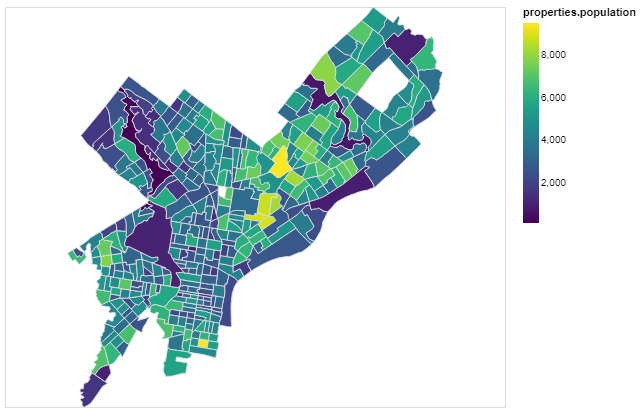

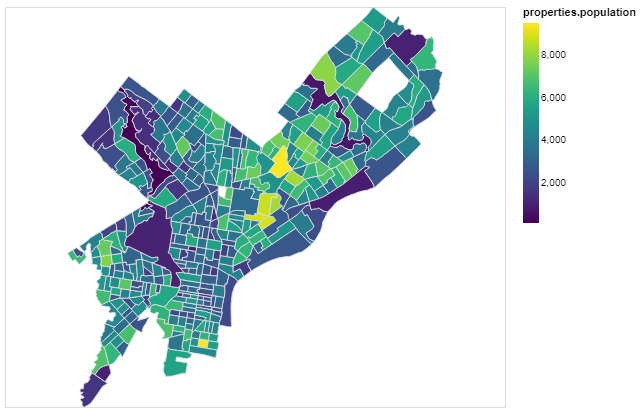

In [44]:
tracts_alt = alt.InlineData(values = tracts_gdf_selected.dropna().to_json(),
                       format = alt.DataFormat(property = 'features', type = 'json'))

alt.Chart(tracts_alt).mark_geoshape(
    stroke='population',
).properties(
    width=500,
    height=400,
    projection={"type":'mercator'},
).encode(
    tooltip=['properties.population:Q', 'properties.NAME:N'],
    color='properties.population:Q'
)

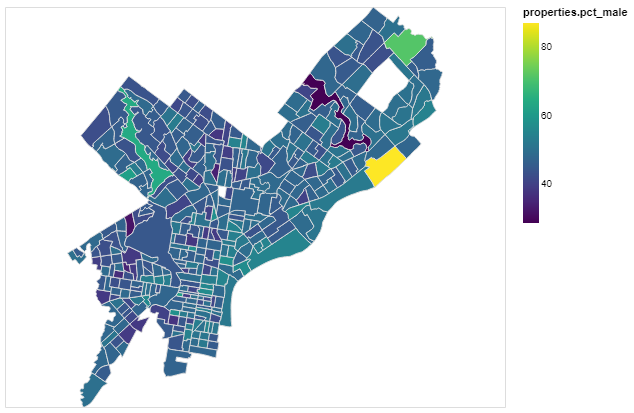

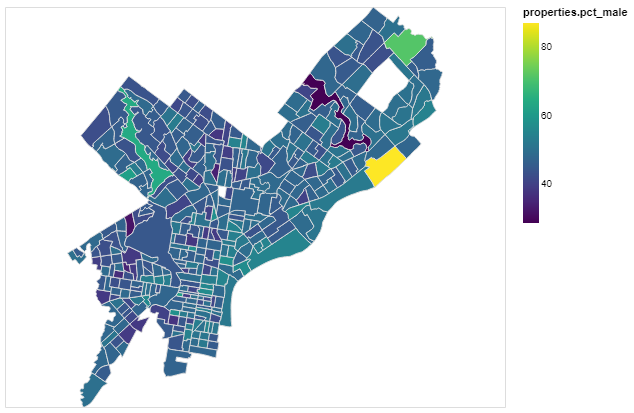

In [45]:
alt.Chart(tracts_alt).mark_geoshape(
    stroke='pct_male',
).properties(
    width=500,
    height=400,
    projection={"type":'mercator'},
).encode(
    tooltip=['properties.pct_male:Q', 'properties.NAME:N'],
    color='properties.pct_male:Q'
)

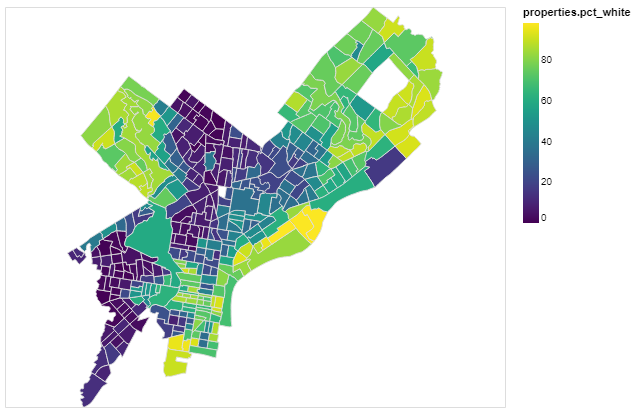

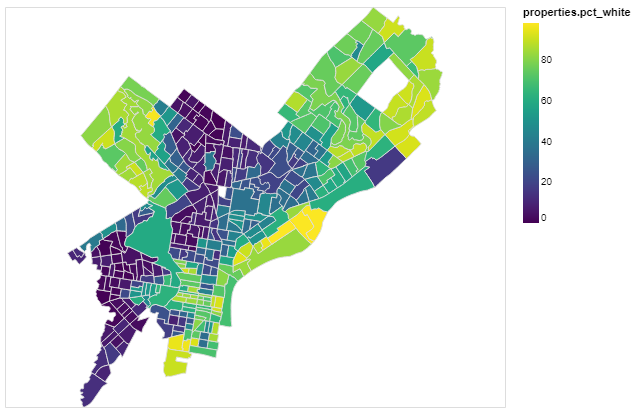

In [46]:
alt.Chart(tracts_alt).mark_geoshape(
    stroke='pct_white',
).properties(
    width=500,
    height=400,
    projection={"type":'mercator'},
).encode(
    tooltip=['properties.pct_white:Q', 'properties.NAME:N'],
    color='properties.pct_white:Q'
)

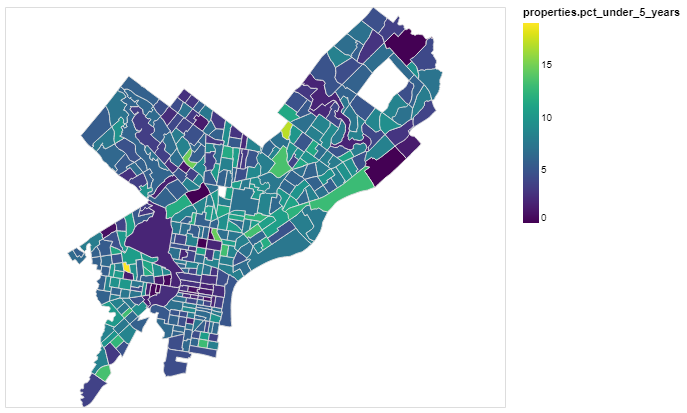

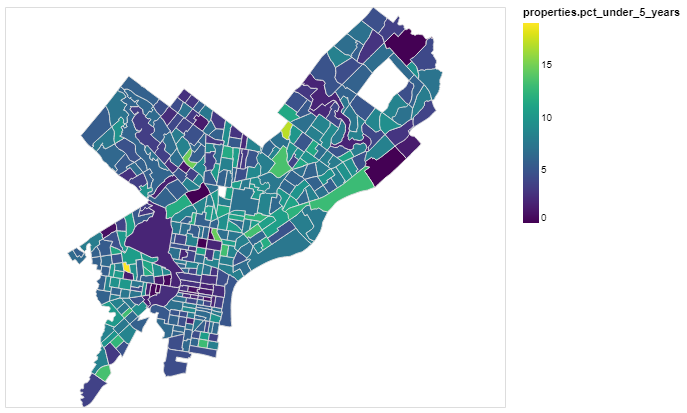

In [47]:
alt.Chart(tracts_alt).mark_geoshape(
    stroke='pct_under_5_years',
).properties(
    width=500,
    height=400,
    projection={"type":'mercator'},
).encode(
    tooltip=['properties.pct_under_5_years:Q', 'properties.NAME:N'],
    color='properties.pct_under_5_years:Q'
)

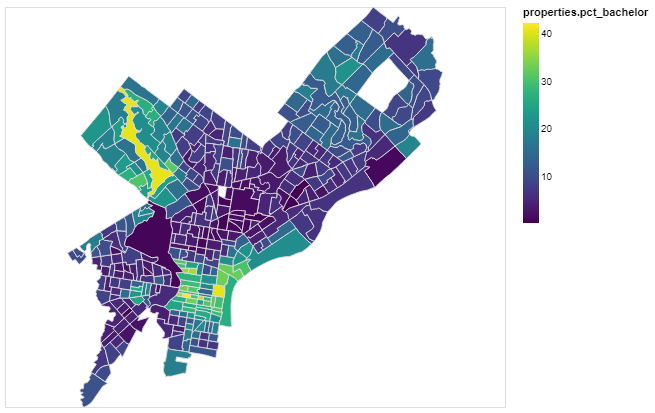

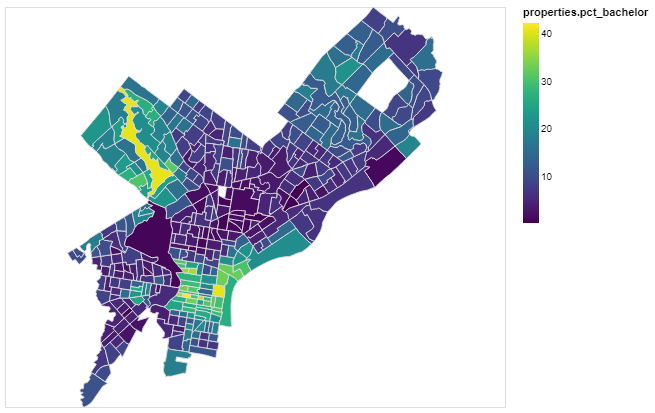

In [51]:
alt.Chart(tracts_alt).mark_geoshape(
    stroke='pct_bachelor',
).properties(
    width=500,
    height=400,
    projection={"type":'mercator'},
).encode(
    tooltip=['properties.pct_bachelor:Q', 'properties.NAME:N'],
    color='properties.pct_bachelor:Q'
)

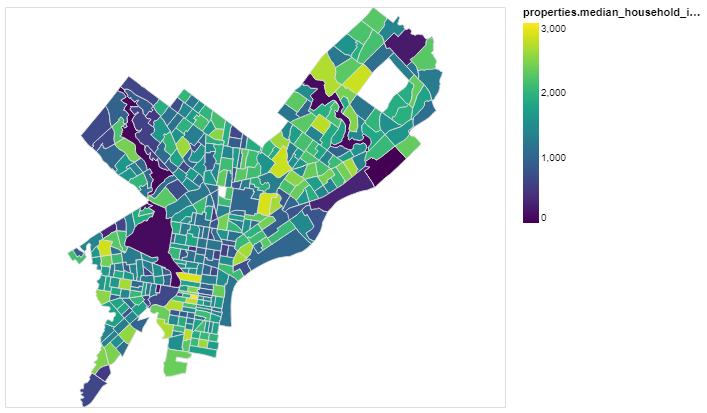

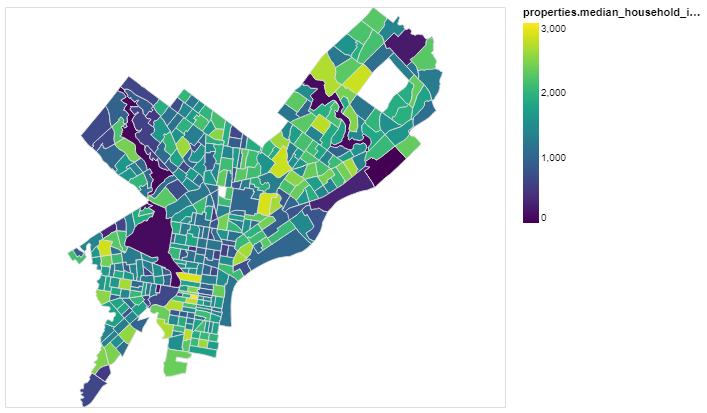

In [49]:
alt.Chart(tracts_alt).mark_geoshape(
    stroke='median_household_income',
).properties(
    width=500,
    height=400,
    projection={"type":'mercator'},
).encode(
    tooltip=['properties.median_household_income:Q', 'properties.NAME:N'],
    color='properties.median_household_income:Q'
)

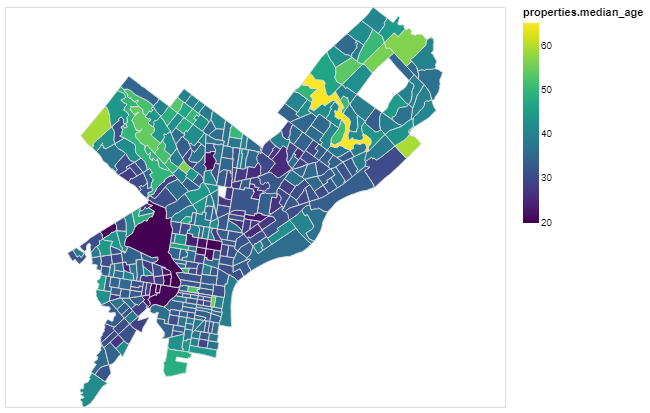

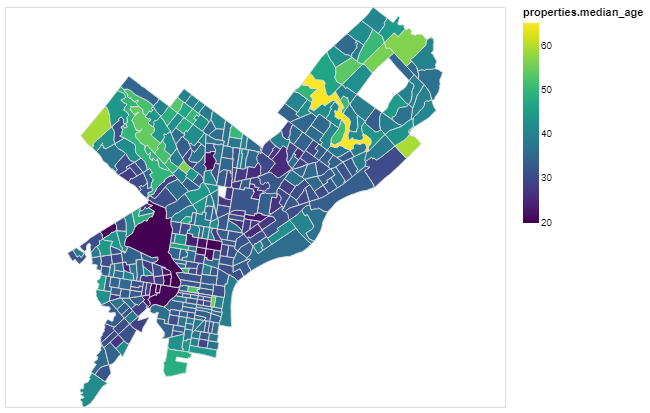

In [50]:
alt.Chart(tracts_alt).mark_geoshape(
    stroke='median_age',
).properties(
    width=500,
    height=400,
    projection={"type":'mercator'},
).encode(
    tooltip=['properties.median_age:Q', 'properties.NAME:N'],
    color='properties.median_age:Q'
)

The spatial distribution patterns of each demographic variable are presented as above respectively, which deliver a general description of
the relationship in demographics between tracts. It's observed that census tracts in Philadelphia exhibit some degree of clustering visually, that is, census tracts with similar demographics are close to each other in space. Next, it's of more interest to look at the overall situation (similarity and difference) of these tracts, by classifying them into specific groups.

## 1.4 K-Means Clustering

### Select Variables for Clustering

In [52]:
from sklearn.cluster import KMeans

In [53]:
# Set the cluster number as 3
kmeans = KMeans(n_clusters = 3)

In [54]:
var_cluster = ['median_age', 'median_household_income', 'pct_male', 'pct_white', 'pct_under_5_years', 'pct_bachelor',
                'GEOID']
tracts_cluster = tracts_gdf_selected[var_cluster].dropna()
tracts_cluster.head()

,median_age,median_household_income,pct_male,pct_white,pct_under_5_years,pct_bachelor,GEOID
0,40.6,1107.0,54.315536,88.719390,3.853874,7.105580,42017100103
1,30.9,2367.0,48.712395,71.961492,2.382671,40.722022,42101000100
2,33.3,1010.0,55.721208,26.015654,1.789042,19.567648,42101000200
3,32.6,1805.0,44.397284,73.655914,2.631579,28.975665,42101000300
4,31.5,933.0,56.722355,43.595863,1.392204,14.558473,42101000500


### Standardize Data
For the purpose of unit scale and remove the influence of measurement units.

In [55]:
from sklearn.preprocessing import StandardScaler

In [56]:
# Scale data to standardized form (GEOID is excluded)
scaler = StandardScaler()
tracts_cluster_scaled = scaler.fit_transform(tracts_cluster.drop('GEOID', axis=1))

# Check whether scale-function runs successfully
tracts_cluster_scaled.std(axis = 0)

array([1., 1., 1., 1., 1., 1.])

### Classify

In [57]:
kmeans.fit(tracts_cluster_scaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [58]:
tracts_cluster['label'] = kmeans.labels_
tracts_cluster.head()

,median_age,median_household_income,pct_male,pct_white,pct_under_5_years,pct_bachelor,GEOID,label
0,40.6,1107.0,54.315536,88.719390,3.853874,7.105580,42017100103,0
1,30.9,2367.0,48.712395,71.961492,2.382671,40.722022,42101000100,1
2,33.3,1010.0,55.721208,26.015654,1.789042,19.567648,42101000200,0
3,32.6,1805.0,44.397284,73.655914,2.631579,28.975665,42101000300,1
4,31.5,933.0,56.722355,43.595863,1.392204,14.558473,42101000500,0


In [59]:
print('The number of classified tracts using K-means is %d.' %len(tracts_cluster))

The number of classified tracts using K-means is 377.


### Plot: Clustering over Space

In [60]:
import pandas as pd

In [61]:
# Join clustering labels back to GeoDataFrame tracts data
tracts_gdf_selected = pd.merge(tracts_gdf_selected, tracts_cluster[['GEOID', 'label']], left_on = 'GEOID', right_on = 'GEOID')

tracts_gdf_selected.head()

,median_age,median_household_income,population,pct_male,pct_white,pct_under_5_years,pct_bachelor,income_level,NAME,GEOID,geometry,label
0,40.6,1107.0,2491.0,54.315536,88.719390,3.853874,7.105580,low,"Census Tract 1001.03, Bucks County, Pennsylvania",42017100103,"POLYGON ((-74.984893 40.057287, -74.9848049999...",0
1,30.9,2367.0,4155.0,48.712395,71.961492,2.382671,40.722022,high,"Census Tract 1, Philadelphia County, Pennsylvania",42101000100,"POLYGON ((-75.15221200000001 39.949968, -75.15...",1
2,33.3,1010.0,2683.0,55.721208,26.015654,1.789042,19.567648,low,"Census Tract 2, Philadelphia County, Pennsylvania",42101000200,"POLYGON ((-75.162886 39.955329, -75.162688 39....",0
3,32.6,1805.0,3534.0,44.397284,73.655914,2.631579,28.975665,median,"Census Tract 3, Philadelphia County, Pennsylvania",42101000300,"POLYGON ((-75.179937 39.960028, -75.1794150000...",1
4,31.5,933.0,2514.0,56.722355,43.595863,1.392204,14.558473,low,"Census Tract 5, Philadelphia County, Pennsylvania",42101000500,"POLYGON ((-75.165299 39.952284, -75.165226 39....",0


In [64]:
from matplotlib import pyplot as plt
from collections import OrderedDict
cmaps = OrderedDict()

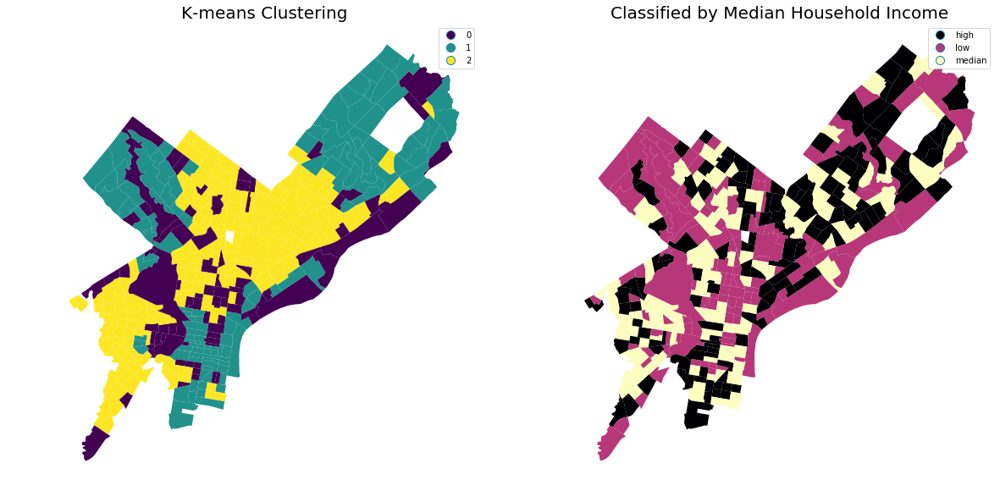

In [66]:
fig, (ax1, ax2) = plt.subplots(1, 2)

tracts_gdf_selected.to_crs(epsg = '3857').plot(column = 'label', cmap = 'viridis', categorical = True, legend = True, ax = ax1)
tracts_gdf_selected.to_crs(epsg = '3857').plot(column = 'income_level', cmap = 'magma', categorical = True, legend = True, ax = ax2)

fig.set_size_inches((20,10))
ax1.set_title('K-means Clustering', fontsize = 20)
ax1.set_axis_off()
ax2.set_title('Classified by Median Household Income', fontsize = 20)
ax2.set_axis_off()

377 census tracts in Philadelphia are grouped into 5 classes based on demographic variables using K-means clustering. The results show that tracts locating at the central, north and southwest Philadelphia are considered more similar to each other and labeled with "2". Accordingly, the northeast, sourth, and northwest Philadelphia are classified into the same group "1". As for the group "0", there is merely no obvious distribution pattern among these tracts.

For the purpose of comparison, the spatial distribution of tracts classified by income level is also presented on the right. It turns out that tracts with relatively low median household income to some extent aggre with group "1", while the other two groups of median and high income levels are more dispersed.

# 2 Indego Trip Data
The Indego trip data is collected from web: https://www.rideindego.com/about/data/
### Import Data

In [67]:
import pandas as pd

In [68]:
q1 = pd.read_csv("data/indego-trips-2018-q1.csv")
q2 = pd.read_csv("data/indego-trips-2018-q2.csv")
q3 = pd.read_csv("data/indego-trips-2018-q3.csv")
q4 = pd.read_csv("data/indego-trips-2018-q4.csv")

C:\Users\Jax\Anaconda3\envs\musa-620\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [69]:
frames = [q1, q2, q3, q4]
indego = pd.concat(frames)

C:\Users\Jax\Anaconda3\envs\musa-620\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


## 2.1 Temporal Patterns

In [70]:
# Convert time-related columns to date type
indego.start_time = pd.to_datetime(indego.start_time)
indego.end_time = pd.to_datetime(indego.end_time)

# Create new columns month, hour, and day of week based on start_time column
indego['month'] = pd.DatetimeIndex(indego['start_time']).month
indego['week'] = pd.DatetimeIndex(indego['start_time']).week
indego['dow'] = indego['start_time'].dt.day_name()
indego['date'] = pd.DatetimeIndex(indego['start_time']).date
indego['hour'] = pd.DatetimeIndex(indego['start_time']).hour

In [71]:
indego.head()

,bike_id,bike_type,duration,end_lat,end_lon,end_station,end_time,passholder_type,plan_duration,start_lat,start_lon,start_station,start_time,trip_id,trip_route_category,month,week,dow,date,hour
0,3708,NaN,18,39.961430,-75.152420,3073,2018-01-01 00:42:00,Indego30,30,39.952950,-75.139793,3124,2018-01-01 00:24:00,223869188,One Way,1,1,Monday,2018-01-01,0
1,3288,NaN,572,39.945610,-75.173477,3066,2018-01-01 10:10:00,Indego365,365,39.950481,-75.172859,3023,2018-01-01 00:38:00,223905597,One Way,1,1,Monday,2018-01-01,0
2,11735,NaN,22,39.950481,-75.172859,3023,2018-01-01 01:10:00,Indego30,30,39.941380,-75.145638,3026,2018-01-01 00:48:00,223872811,One Way,1,1,Monday,2018-01-01,0
3,5202,NaN,21,39.954239,-75.161377,3037,2018-01-01 01:24:00,Indego30,30,39.947922,-75.162369,3045,2018-01-01 01:03:00,223872810,One Way,1,1,Monday,2018-01-01,1
4,5142,NaN,4,39.967159,-75.170013,3058,2018-01-01 01:09:00,Indego30,30,39.972630,-75.167572,3115,2018-01-01 01:05:00,223872809,One Way,1,1,Monday,2018-01-01,1


###  Trip Counts by Hour

In [72]:
import seaborn as sns

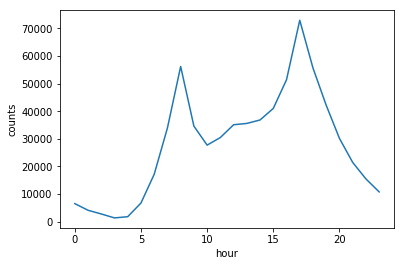

In [73]:
indego_by_hour = indego.groupby('hour').size().reset_index(name='counts')
sns.lineplot(x = 'hour', y = 'counts', data = indego_by_hour)

Indego trips are most likely to happen during at nightfall, followed by the morning at 8:00 a.m., which corresponds well to commnon commuting schedule.

###  Trip Counts by Month

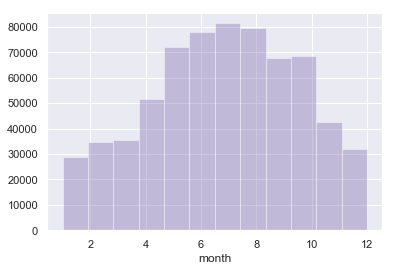

In [74]:
sns.set(style="darkgrid")
sns.distplot(indego['month'], kde = False, color="m", bins = 12)

Indego trips reach the peak during summer.

###  Trip Counts by Day of Week

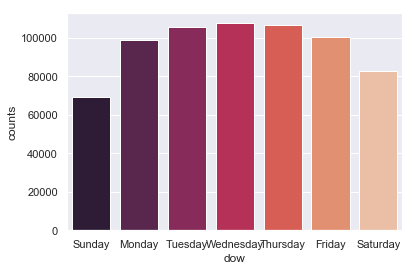

In [75]:
indego_by_dow = indego.groupby('dow').size().reset_index(name='counts')

dow_order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

sns.barplot(x = indego_by_dow['dow'], y = indego_by_dow['counts'], palette = 'rocket', order = dow_order)

The number of Indego trips are smaller during weekends than weekdays.

###  Trip Counts by Day of Week & Hour

In [152]:
# Count trips
indego_by_dow_hour = indego.groupby(['dow', 'hour']).size().reset_index(name = 'counts')

# Sort day of week by correct order, otherwise it were ordered by first letter of dow (string) alphabetically
indego_by_dow_hour.dow = pd.Categorical(indego_by_dow_hour.dow, dow_order)
indego_by_dow_hour = indego_by_dow_hour.sort_values('dow')

indego_by_dow_hour.head()

,dow,hour,counts
83,Sunday,11,4730
72,Sunday,0,1219
73,Sunday,1,986
74,Sunday,2,791
75,Sunday,3,321


In [153]:
indego_by_dow_hour.hvplot.heatmap(y="dow", x="hour", 
                               C='counts', cmap='magma',
                               width=800, height=500, flip_yaxis=True)

:HeatMap   [hour,dow]   (counts)

Indego trips in 2018 concentrate at around 8:00 a.m. and 17:00 p.m. on weekdays, which correspons well with daily commuting schedule.

## 2.2 Spatial Distribution

### Import Station Data 

In [154]:
import json
import geopandas as gpd

In [155]:
with open("data/stations.json") as f:
    stations_json = json.load(f)
stations = gpd.GeoDataFrame.from_features(stations_json)

In [156]:
stations.head()

,addressCity,addressState,addressStreet,addressZipCode,bikesAvailable,classicBikesAvailable,closeTime,docksAvailable,electricBikesAvailable,eventEnd,...,latitude,longitude,name,notes,openTime,publicText,smartBikesAvailable,timeZone,totalDocks,trikesAvailable
0,Philadelphia,PA,1401 John F. Kennedy Blvd.,19102,10,10,03:55:00,20,0,None,...,39.95378,-75.16374,Municipal Services Building Plaza,None,04:00:00,,0,Eastern Standard Time,30,0
1,Philadelphia,PA,191 S. 2nd St.,19106,3,3,03:55:00,9,0,None,...,39.94733,-75.14403,"Welcome Park, NPS",None,04:00:00,,0,Eastern Standard Time,13,0
2,Philadelphia,PA,246 S. 40th St.,19104,1,1,03:55:00,16,0,None,...,39.95220,-75.20311,40th & Spruce,None,04:00:00,,0,Eastern Standard Time,17,0
3,Philadelphia,PA,328 S. 11th St.,19107,9,9,03:55:00,5,0,None,...,39.94517,-75.15993,"11th & Pine, Kahn Park",None,04:00:00,,0,Eastern Standard Time,15,0
4,Philadelphia,PA,1076 Berks Street,19122,1,1,03:55:00,17,0,None,...,39.98078,-75.15055,Temple University Station,None,04:00:00,,0,Eastern Standard Time,19,0


In [157]:
stations.columns

Index(['addressCity', 'addressState', 'addressStreet', 'addressZipCode',
       'bikesAvailable', 'classicBikesAvailable', 'closeTime',
       'docksAvailable', 'electricBikesAvailable', 'eventEnd', 'eventStart',
       'geometry', 'hasGeofence', 'isArchived', 'isEventBased', 'isVirtual',
       'isVisible', 'kioskConnectionStatus', 'kioskId', 'kioskPublicStatus',
       'kioskStatus', 'kioskType', 'latitude', 'longitude', 'name', 'notes',
       'openTime', 'publicText', 'smartBikesAvailable', 'timeZone',
       'totalDocks', 'trikesAvailable'],
      dtype='object')

### Convert to GeoDataFrame

In [160]:
from geopandas import GeoDataFrame
from shapely.geometry import Point

In [161]:
# Initialize the geographic reference system as WGS 1984
crs = {'init': 'epsg:4326'}
# Project ot Mercator system
stations_gdf = GeoDataFrame(stations, crs = crs, geometry = 'geometry').to_crs(epsg = 3857)
stations_gdf.head()

,addressCity,addressState,addressStreet,addressZipCode,bikesAvailable,classicBikesAvailable,closeTime,docksAvailable,electricBikesAvailable,eventEnd,...,latitude,longitude,name,notes,openTime,publicText,smartBikesAvailable,timeZone,totalDocks,trikesAvailable
0,Philadelphia,PA,1401 John F. Kennedy Blvd.,19102,10,10,03:55:00,20,0,None,...,39.95378,-75.16374,Municipal Services Building Plaza,None,04:00:00,,0,Eastern Standard Time,30,0
1,Philadelphia,PA,191 S. 2nd St.,19106,3,3,03:55:00,9,0,None,...,39.94733,-75.14403,"Welcome Park, NPS",None,04:00:00,,0,Eastern Standard Time,13,0
2,Philadelphia,PA,246 S. 40th St.,19104,1,1,03:55:00,16,0,None,...,39.95220,-75.20311,40th & Spruce,None,04:00:00,,0,Eastern Standard Time,17,0
3,Philadelphia,PA,328 S. 11th St.,19107,9,9,03:55:00,5,0,None,...,39.94517,-75.15993,"11th & Pine, Kahn Park",None,04:00:00,,0,Eastern Standard Time,15,0
4,Philadelphia,PA,1076 Berks Street,19122,1,1,03:55:00,17,0,None,...,39.98078,-75.15055,Temple University Station,None,04:00:00,,0,Eastern Standard Time,19,0


### Join Trip Counts to Station Data

In [162]:
# Count trips by station
by_startStation = indego.groupby('start_station').size().reset_index(name = 'counts')
by_startStation.head()

,start_station,counts
0,3000,46
1,3004,7197
2,3005,4191
3,3006,4194
4,3007,10057


In [163]:
stations_gdf = stations_gdf.merge(by_startStation, left_on = 'kioskId', right_on = 'start_station')
stations_gdf.head()

,addressCity,addressState,addressStreet,addressZipCode,bikesAvailable,classicBikesAvailable,closeTime,docksAvailable,electricBikesAvailable,eventEnd,...,name,notes,openTime,publicText,smartBikesAvailable,timeZone,totalDocks,trikesAvailable,start_station,counts
0,Philadelphia,PA,1401 John F. Kennedy Blvd.,19102,10,10,03:55:00,20,0,None,...,Municipal Services Building Plaza,None,04:00:00,,0,Eastern Standard Time,30,0,3004,7197
1,Philadelphia,PA,191 S. 2nd St.,19106,3,3,03:55:00,9,0,None,...,"Welcome Park, NPS",None,04:00:00,,0,Eastern Standard Time,13,0,3005,4191
2,Philadelphia,PA,246 S. 40th St.,19104,1,1,03:55:00,16,0,None,...,40th & Spruce,None,04:00:00,,0,Eastern Standard Time,17,0,3006,4194
3,Philadelphia,PA,328 S. 11th St.,19107,9,9,03:55:00,5,0,None,...,"11th & Pine, Kahn Park",None,04:00:00,,0,Eastern Standard Time,15,0,3007,10057
4,Philadelphia,PA,1076 Berks Street,19122,1,1,03:55:00,17,0,None,...,Temple University Station,None,04:00:00,,0,Eastern Standard Time,19,0,3008,2516


In [164]:
stations_gdf.columns

Index(['addressCity', 'addressState', 'addressStreet', 'addressZipCode',
       'bikesAvailable', 'classicBikesAvailable', 'closeTime',
       'docksAvailable', 'electricBikesAvailable', 'eventEnd', 'eventStart',
       'geometry', 'hasGeofence', 'isArchived', 'isEventBased', 'isVirtual',
       'isVisible', 'kioskConnectionStatus', 'kioskId', 'kioskPublicStatus',
       'kioskStatus', 'kioskType', 'latitude', 'longitude', 'name', 'notes',
       'openTime', 'publicText', 'smartBikesAvailable', 'timeZone',
       'totalDocks', 'trikesAvailable', 'start_station', 'counts'],
      dtype='object')

### Plot: Trip Counts at Each Station

In [166]:
import branca.colormap as cm
color_ramp = cm.linear.YlOrRd_09.scale(0, 16000)
color_ramp

In [167]:
import folium

In [168]:
def get_style(feature):
    return {'weight': 2, 'color': 'white'}

def get_highlighted_style(feature):
    return {'weight': 2, 'color': 'red'}

In [173]:
# Center the map on Philadelphia
m = folium.Map(
    location=[39.99, -75.13],
    tiles='Cartodb dark_matter',
    zoom_start=11
)

folium.GeoJson(
    tracts_gdf_selected.to_json(),
    name='Philadelphia Tracts',
    style_function=get_style,
    highlight_function=get_highlighted_style,
    tooltip=folium.GeoJsonTooltip(['NAME'])
).add_to(m)

In [174]:
# Extract the latitude, longitude and trip counts
points = stations_gdf[['latitude', 'longitude', 'counts']].values

In [177]:
for lat, lon, counts in points:
    folium.Circle(
        radius = 1,
        location = [lat, lon],
        color = color_ramp(counts)
    ).add_to(m)

m.save('trip counts.html')

m

In [176]:
# ax = tracts_gdf_selected.to_crs(epsg = 3857).plot(facecolor='none', edgecolor='black')
# stations_gdf.plot(ax = ax, legend = True, markersize = 25,
#                   column = 'counts')
# ax.figure.set_size_inches((15,16))
# ax.set_title('Trip Counts in 2018 by Station', fontsize=16)

Indego stations are distributed around center city and outer zones. Trip counts at central Philly are higher than those at outer zones, which is assumed to be a result of that tracts at center city have denser population than other areas.

# 3 Weather
The weather data is collected from web: https://www.wunderground.com/weather/us/pa/philadelphia

## 3.1 Temperature & Precipation

### Import Data

In [178]:
weather = pd.read_csv("data/weather.csv")

In [179]:
# Convert time-related columns to date type
weather.Date = pd.to_datetime(weather.Date, format='%Y%m%d')

In [180]:
weather.head()

,Date,Temperature Max,Temperature Avg,Temperature Min,Dew Point Max,Dew Point Avg,Dew Point Min,Humidity Max,Humidity Avg,Humidity Min,Speed Max,Speed Avg,Speed Min,Pressure Max,Pressure Avg,Pressure Min,Precipitation Max,Precipitation Avg,Precipitation Min
0,2018-01-01,20,13,6,1,-3,-6,60,-,34,20,-,6,30.48,-,30.41,-,0.00,-
1,2018-01-02,24,18,12,6,2,-3,55,-,42,20,-,10,30.52,-,30.39,-,0.00,-
2,2018-01-03,33,23,13,10,1,-2,61,-,27,13,-,0,30.39,-,29.96,-,0.00,-
3,2018-01-04,29,23,16,21,16,-3,88,-,39,35,-,9,29.95,-,29.41,-,0.25,-
4,2018-01-05,17,14,11,-3,-5,-8,51,-,37,33,-,16,30.20,-,29.77,-,0.00,-


### Plot: Weather

In [181]:
import matplotlib.pyplot as plt

C:\Users\Jax\Anaconda3\envs\musa-620\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


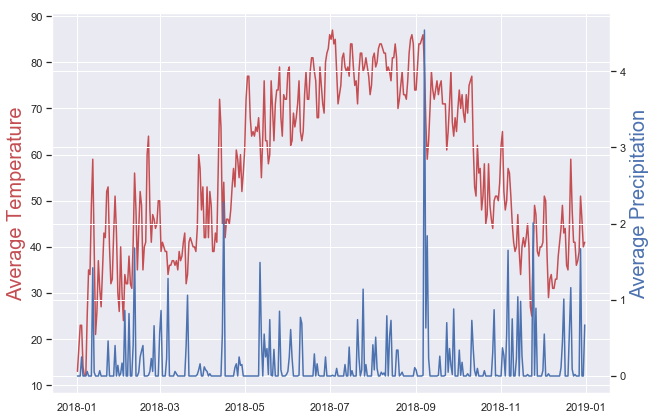

In [182]:
fig, ax1 = plt.subplots(figsize=(10, 7))

ax2 = ax1.twinx()

ax1.plot(weather['Date'], weather['Temperature Avg'], 'r-')
ax2.plot(weather['Date'], weather['Precipitation Avg'], 'b-')

# ax1.set_xlabel('Date')
ax1.set_ylabel('Average Temperature', color = 'r', fontsize = 20)
ax2.set_ylabel('Average Precipitation', color = 'b', fontsize = 20)

plt.show()

An overview of precipitation and temperature situation of Philadelphia is presented as above. Next, we will continue to examine its relation with trips.

## 3.2 Indego Trips vs. Weather
This time we compare Indego trips with average temperature & precipitation by WEEK.

### Wrangle Each Dataset by Week

In [183]:
indego_by_week = indego.groupby('week').size().reset_index(name='counts')

weather['week'] = weather['Date'].dt.week
weather_by_week = weather.groupby('week').mean().reset_index()

### Plot: Trip Counts vs. Weather

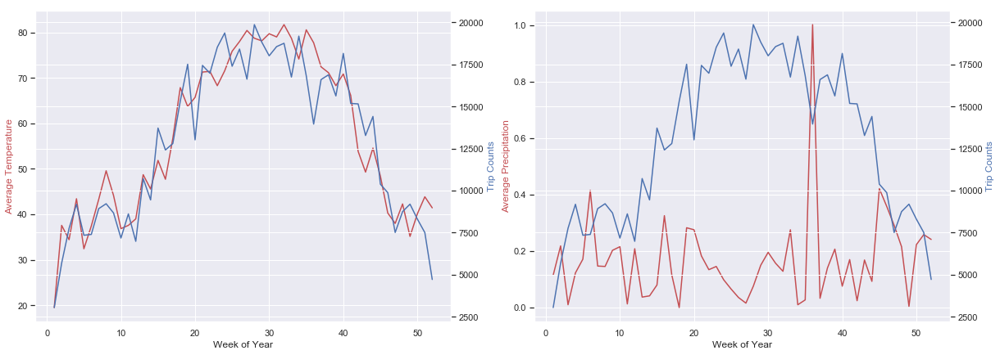

In [184]:
fig, (ax_left1, ax_right1) = plt.subplots(1, 2, figsize=(20, 7))

# Left: trips vs. average tempereature
ax_left2 = ax_left1.twinx()
ax_left1.plot(weather_by_week['week'], weather_by_week['Temperature Avg'], 'r-')
ax_left2.plot(indego_by_week['week'], indego_by_week['counts'], 'b-')

ax_left1.set_xlabel('Week of Year')

ax_left1.set_ylabel('Average Temperature', color='r')
ax_left2.set_ylabel('Trip Counts', color='b')

# Right: trips vs. average pricipitation
ax_right2 = ax_right1.twinx()
ax_right1.plot(weather_by_week['week'], weather_by_week['Precipitation Avg'], 'r-')
ax_right2.plot(indego_by_week['week'], indego_by_week['counts'], 'b-')

ax_right1.set_xlabel('Week of Year')
ax_right1.set_ylabel('Average Precipitation', color='r')
ax_right2.set_ylabel('Trip Counts', color='b')

plt.show()

Temperature is more correlated to trip counts than precipitation visually. More specifically, higher temperatures agree with higher trip counts.

# 4 Environmental Factor: Liquor Violations
## 4.1 Request Data

In [216]:
import numpy as np
import cartopy.crs as ccrs
from pyrestcli.auth import NoAuthClient
from carto.sql import SQLClient

In [217]:
sql_client = SQLClient(NoAuthClient("https://phl.carto.com"))

In [218]:
table_name = "li_violations"
query = "SELECT COUNT(*) FROM %s" %table_name
response = sql_client.send(query)
response

C:\Users\Jax\Anaconda3\envs\musa-620\lib\site-packages\pyrestcli\auth.py:79: UserWarning: You are using methods other than get with no authentication!!!
  warnings.warn(_("You are using methods other than get with no authentication!!!"))


{'rows': [{'count': 1350860}],
 'time': 0.517,
 'fields': {'count': {'type': 'number'}},
 'total_rows': 1}

In [293]:
features = sql_client.send("SELECT * FROM %s" % table_name, format = 'geojson')
violations_gdf = gpd.GeoDataFrame.from_features(features, crs={'init':'epsg:4326'})

In [220]:
print('The number of liquor violations is', len(violations_gdf))

The number of liquor violations is 1350860


Since this dataset contains more 1 million rows, it should be ploted using datashader.

## 4.2 Plot: Liquor Violations Map (Large Data)

In [294]:
selected_columns = ['geocode_x', 'geocode_y', 'geometry', 'violationdate']
violations_gdf = violations_gdf[selected_columns]

violations_gdf['year'] = violations_gdf['violationdate'].str.slice(stop=4)
violations_gdf['year'] = pd.to_numeric(violations_gdf['year'], errors='coerce')

violations_gdf.head()

,geocode_x,geocode_y,geometry,violationdate,year
0,2.737161e+06,274918.080562,POINT (-75.00367900000001 40.055198),2016-07-11T00:00:00Z,2016
1,2.730559e+06,301244.660744,POINT (-75.024348 40.127994),2009-08-06T00:00:00Z,2009
2,2.679146e+06,223303.696669,POINT (-75.216131 39.918334),2017-09-21T00:00:00Z,2017
3,2.714601e+06,251324.947639,POINT (-75.086772 39.992359),2019-01-29T00:00:00Z,2019
4,2.674968e+06,247875.056346,POINT (-75.22851900000001 39.986086),2018-08-06T00:00:00Z,2018


In [295]:
# Figure out the boundary of data
print("max x:", violations_gdf['geocode_x'].max())
print("min x:", violations_gdf['geocode_x'].min())
print("max y:", violations_gdf['geocode_y'].max())
print("min y:", violations_gdf['geocode_y'].min())

max x: 2749132.77144226
min x: 2662255.07966446
max y: 304755.1683313
min y: 208098.12739443


In [224]:
Philly = x_range, y_range = ((2660000,2750000),(208000,305000))

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
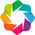

In [229]:
import holoviews as hv
import geoviews as gv
from holoviews.operation.datashader import datashade
hv.extension("bokeh")

import datashader as ds
import datashader.transfer_functions as tf

from datashader.colors import viridis
from colorcet import fire

In [296]:
points = hv.Points(violations_gdf, kdims=['geocode_x', 'geocode_y'])

In [297]:
plot_width  = 500
plot_height = 550

In [298]:
datashade(points, cmap=viridis).opts(width=500, height=550, bgcolor="black")

:DynamicMap   []
   :RGB   [geocode_x,geocode_y]   (R,G,B,A)

# PART II<br>REGRESSION ANALYSIS

# 5 Combine All Datasets

## 5.1 Trip Counts by Spatial-Temporal Variables

In [185]:
start_gp = indego.groupby(['start_station', 'month', 'week', 'dow', 'hour', 'date']).size().reset_index(name = 'counts')

# Convert date to the form of string for subsequent merging 
start_gp.date = start_gp.date.astype(str)
start_gp.head()

,start_station,month,week,dow,hour,date,counts
0,3000,5,20,Friday,6,2018-05-18,1
1,3000,5,20,Friday,7,2018-05-18,1
2,3000,5,20,Friday,8,2018-05-18,5
3,3000,5,20,Friday,9,2018-05-18,4
4,3000,5,20,Friday,14,2018-05-18,1


It turns out that trips have been grouped by specific temporal variables and counted sucessfully.

## 5.2 Join Weather Data to Trip Counts (by Date)

In [186]:
# Convert date to the form of string for subsequent merging 
weather.Date = weather.Date.astype(str)
weather.head()

,Date,Temperature Max,Temperature Avg,Temperature Min,Dew Point Max,Dew Point Avg,Dew Point Min,Humidity Max,Humidity Avg,Humidity Min,Speed Max,Speed Avg,Speed Min,Pressure Max,Pressure Avg,Pressure Min,Precipitation Max,Precipitation Avg,Precipitation Min,week
0,2018-01-01,20,13,6,1,-3,-6,60,-,34,20,-,6,30.48,-,30.41,-,0.00,-,1
1,2018-01-02,24,18,12,6,2,-3,55,-,42,20,-,10,30.52,-,30.39,-,0.00,-,1
2,2018-01-03,33,23,13,10,1,-2,61,-,27,13,-,0,30.39,-,29.96,-,0.00,-,1
3,2018-01-04,29,23,16,21,16,-3,88,-,39,35,-,9,29.95,-,29.41,-,0.25,-,1
4,2018-01-05,17,14,11,-3,-5,-8,51,-,37,33,-,16,30.20,-,29.77,-,0.00,-,1


In [187]:
temp_data1 = pd.merge(start_gp, weather[['Date', 'Temperature Avg', 'Precipitation Avg']], left_on = 'date', right_on = 'Date').drop('Date', axis = 1)
temp_data1.head()

,start_station,month,week,dow,hour,date,counts,Temperature Avg,Precipitation Avg
0,3000,5,20,Friday,6,2018-05-18,1,58,0.02
1,3000,5,20,Friday,7,2018-05-18,1,58,0.02
2,3000,5,20,Friday,8,2018-05-18,5,58,0.02
3,3000,5,20,Friday,9,2018-05-18,4,58,0.02
4,3000,5,20,Friday,14,2018-05-18,1,58,0.02


Trip counts by station (spatial) and time-related variables (temporal) have been joined with weather data.

## 5.3 Spatial-Join Demographics to Trip Counts (by Location)

In [188]:
# Merge the data from step 1.2 back to stations data to acquire the geometry info
temp_data2 = pd.merge(stations_gdf[['kioskId', 'geometry']], temp_data1, left_on = 'kioskId', right_on = 'start_station')
temp_data2.head()

,kioskId,geometry,start_station,month,week,dow,hour,date,counts,Temperature Avg,Precipitation Avg
0,3004,POINT (-8367189.262918009 4859227.986514178),3004,5,20,Friday,0,2018-05-18,1,58,0.02
1,3004,POINT (-8367189.262918009 4859227.986514178),3004,5,20,Friday,8,2018-05-18,1,58,0.02
2,3004,POINT (-8367189.262918009 4859227.986514178),3004,5,20,Friday,9,2018-05-18,1,58,0.02
3,3004,POINT (-8367189.262918009 4859227.986514178),3004,5,20,Friday,12,2018-05-18,1,58,0.02
4,3004,POINT (-8367189.262918009 4859227.986514178),3004,5,20,Friday,14,2018-05-18,2,58,0.02


In [308]:
# Spatial-join to census tracts to acquire demographic data
temp_data3 = gpd.sjoin(temp_data2.to_crs(epsg = 3857), tracts_gdf_selected.to_crs(epsg = 3857), op = 'within', how = 'left').dropna()
temp_data3.head()

,kioskId,geometry,start_station,month,week,dow,hour,date,counts,Temperature Avg,...,median_household_income,population,pct_male,pct_white,pct_under_5_years,pct_bachelor,income_level,NAME,GEOID,label
0,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,0,2018-05-18,1,58,...,2483.0,3299.0,41.285238,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0
1,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,8,2018-05-18,1,58,...,2483.0,3299.0,41.285238,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0
2,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,9,2018-05-18,1,58,...,2483.0,3299.0,41.285238,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0
3,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,12,2018-05-18,1,58,...,2483.0,3299.0,41.285238,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0
4,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,14,2018-05-18,2,58,...,2483.0,3299.0,41.285238,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0


## 5.4 Spatial-Join Liquor Violations to Trip Counts (by Location)

In [299]:
violations_gdf_2018 = violations_gdf[violations_gdf['year'] == 2018].dropna().reset_index()
violations_gdf_2018.head()

,index,geocode_x,geocode_y,geometry,violationdate,year
0,4,2.674968e+06,247875.056346,POINT (-75.22851900000001 39.986086),2018-08-06T00:00:00Z,2018
1,30,2.711162e+06,250065.499671,POINT (-75.09917799999999 39.989187),2018-12-06T00:00:00Z,2018
2,52,2.698589e+06,275533.224925,POINT (-75.141345 40.060096),2018-03-02T00:00:00Z,2018
3,67,2.675175e+06,247815.482726,POINT (-75.227785 39.985906),2018-10-01T00:00:00Z,2018
4,85,2.736987e+06,279466.707662,POINT (-75.003794 40.067693),2018-09-05T00:00:00Z,2018


In [ ]:
violations_gdf_2018_tract = gpd.sjoin(violations_gdf_2018.to_crs(epsg = 3857), tracts_gdf_selected.to_crs(epsg = 3857), op = 'within', how = 'left')

In [306]:
violations_2018_by_tract = violations_gdf_2018_tract.groupby('GEOID').size().reset_index(name = 'liquor_violations')
violations_2018_by_tract.head()

,GEOID,liquor_violations
0,42101000100,328
1,42101000200,104
2,42101000300,92
3,42101000401,33
4,42101000402,173


In [309]:
temp_data4 = pd.merge(temp_data3, violations_2018_by_tract, left_on = 'GEOID', right_on = 'GEOID')
temp_data4.head()

,kioskId,geometry,start_station,month,week,dow,hour,date,counts,Temperature Avg,...,population,pct_male,pct_white,pct_under_5_years,pct_bachelor,income_level,NAME,GEOID,label,liquor_violations
0,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,0,2018-05-18,1,58,...,3299.0,41.285238,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0,173
1,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,8,2018-05-18,1,58,...,3299.0,41.285238,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0,173
2,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,9,2018-05-18,1,58,...,3299.0,41.285238,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0,173
3,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,12,2018-05-18,1,58,...,3299.0,41.285238,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0,173
4,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,14,2018-05-18,2,58,...,3299.0,41.285238,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0,173


Here, the final dataset including trip count, liquor violations, weather, temporal and demographic data for regression analysis has been created already.

# 6 OLS Regression 
## 6.1 Modeling

In [190]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

The statsmodels.formula.api package is used in R-style language that regresses Y on X through key variable in the form of string like "Y ~ x1 + x2 + ... +xn", so that columns named "Temperature Avg" and "Precipation Avg" with spaces are not allowed, and should be added with underline.

In [314]:
temp_data4.rename(columns={'Temperature Avg': 'Temperature_Avg', 'Precipitation Avg': 'Precipitation_Avg'},
                  inplace=True)
reg_data = temp_data4

In [315]:
ols = smf.ols(formula = 'counts ~ C(start_station) + C(month) + C(week) + C(dow) + C(hour) + population + Temperature_Avg + Precipitation_Avg + median_household_income + median_age + population + pct_male + pct_white + pct_under_5_years + pct_bachelor + liquor_violations', data = reg_data)

ols_results = ols.fit()

## 6.2 Goodness of Fitting
### Regression Results Summary

In [316]:
print(ols_results.summary())

                            OLS Regression Results                            
Dep. Variable:                 counts   R-squared:                       0.192
Model:                            OLS   Adj. R-squared:                  0.192
Method:                 Least Squares   F-statistic:                     358.3
Date:                Mon, 13 May 2019   Prob (F-statistic):               0.00
Time:                        17:28:36   Log-Likelihood:            -6.0668e+05
No. Observations:              328881   AIC:                         1.214e+06
Df Residuals:                  328662   BIC:                         1.216e+06
Df Model:                         218                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept               

It truns out that most of the predictors are statistically significant except for median household income indicated by p-values. Such findings are opposite to our intuitions and priori knowledge. But since the main purpose of this project is to gather, store, and analyze datasets using visualization techniques, the regression analysis serves only as an extension, so that I don't attempt to spend too much time improving this model.

### Predictions vs. Observations

In [317]:
# Join predicted trip counts back to the data frame
reg_data['predicted'] = ols_results.predict()
reg_data['residuals'] = reg_data['counts'] - reg_data['predicted']

In [318]:
reg_data.head()

,kioskId,geometry,start_station,month,week,dow,hour,date,counts,Temperature_Avg,...,pct_white,pct_under_5_years,pct_bachelor,income_level,NAME,GEOID,label,liquor_violations,predicted,residuals
0,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,0,2018-05-18,1,58,...,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0,173,1.577899,-0.577899
1,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,8,2018-05-18,1,58,...,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0,173,2.921563,-1.921563
2,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,9,2018-05-18,1,58,...,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0,173,2.150807,-1.150807
3,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,12,2018-05-18,1,58,...,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0,173,2.149003,-1.149003
4,3004,POINT (-8367189.262918008 4859227.986514178),3004,5,20,Friday,14,2018-05-18,2,58,...,85.08639,0.879054,31.130646,high,"Census Tract 4.02, Philadelphia County, Pennsy...",42101000402,1.0,173,2.226548,-0.226548


The plot below shos the relation between predicted trip counts (blue) and observed ones (orange).

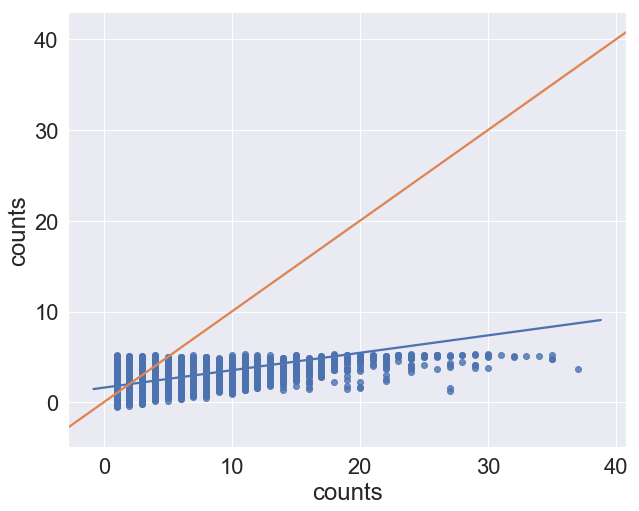

In [331]:
fig, ax = plt.subplots()

sns.set(font_scale = 2)

ax.figure.set_size_inches((10,8))

sns.regplot(x="counts", y="predicted", data=reg_data, ax = ax)
sns.regplot(x="counts", y="counts", scatter = False, data=reg_data, ax = ax)

It's of interest to examine the temporal variance of trips of the most-used station during the most-used week.

In [321]:
indego.groupby(['week', 'start_station']).size().reset_index(name = 'counts').sort_values('counts', ascending = False).head()

,week,start_station,counts
4233,34,3168,560
3349,28,3010,541
2641,22,3057,524
3097,26,3010,517
4129,34,3021,516


In [323]:
week34_station3168 = reg_data.loc[(reg_data['start_station'] == 3168) & (reg_data['week'] == 34)][['dow', 'hour', 'counts', 'predicted']]
week34_station3168.head()

,dow,hour,counts,predicted
239522,Friday,2,2,1.766265
239523,Friday,5,1,1.757073
239524,Friday,6,1,2.123366
239525,Friday,7,4,2.590508
239526,Friday,8,2,3.158383


In [324]:
week34_station3168_melt = pd.melt(week34_station3168, id_vars=['dow', 'hour'])
print(week34_station3168_melt.head())
print(week34_station3168_melt.tail())

      dow  hour variable  value
0  Friday     2   counts    2.0
1  Friday     5   counts    1.0
2  Friday     6   counts    1.0
3  Friday     7   counts    4.0
4  Friday     8   counts    2.0
           dow  hour   variable     value
243  Wednesday    19  predicted  2.729019
244  Wednesday    20  predicted  2.418106
245  Wednesday    21  predicted  2.205299
246  Wednesday    22  predicted  2.084495
247  Wednesday    23  predicted  1.993908


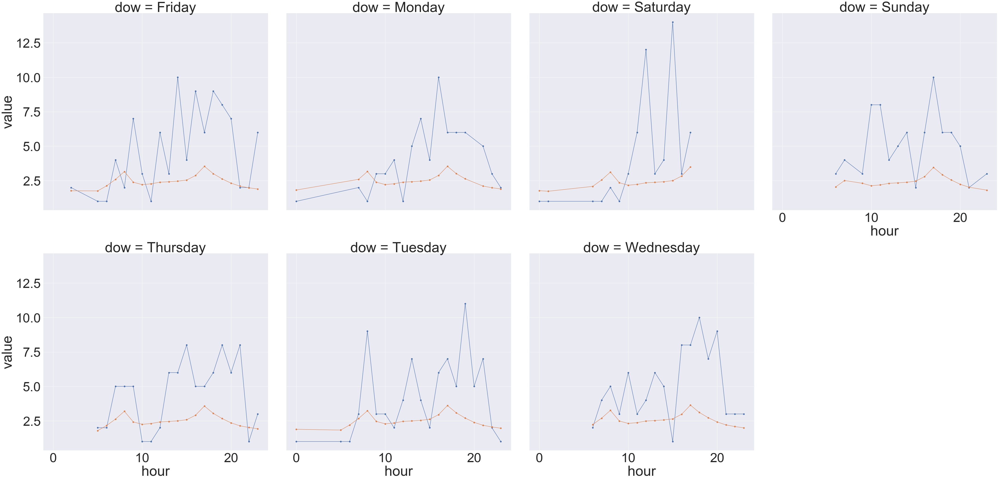

In [325]:
sns.set(font_scale = 5)

g = sns.FacetGrid(week34_station3168_melt, col = 'dow', col_wrap = 4, height = 15, hue = 'variable')
g.map(plt.plot, 'hour', 'value', marker = 'o')

As I have explained above, though this simple OLS model does not perform perfectly in capturing the relation between trip counts and predictors, the primary obejctive of this project is not the accuracy but the process of data wrangling and visulization.

### Predictions vs. Residuals

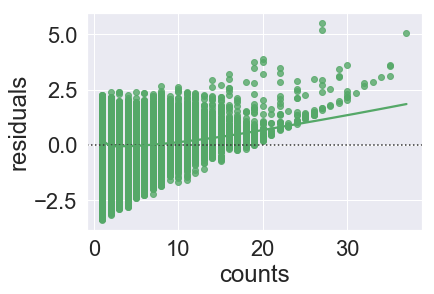

In [330]:
sns.residplot(reg_data['counts'], reg_data['residuals'], lowess=True, color="g")